# Introduction

This notebook explores snow cover classification based on earth observations with four machine learning (ML) models. Two of the models are supervised classifiers and two of the models are unsupervised classifiers. For more comprehensive contextual information, read the Readme.

## Data
### Study Area
The images used in this notebook covers parts of Jämtland in Sweden. The area is high latitude and alpine, with snow still covering the mountains in early summer. However, climate change with it's increasing temperatures, rising more than average in Scandinavia, will result in snow melting earlier.

### Data Source
This notebook utilizes Sentinel 2 image retrieved from Copernicus website. 12 raw bands are used as input to the models, specifically band 1, 2, 3, 4, 5, 6, 7, 8, 8A, 9, 11 and 12. Whilst input data is sufficient for the unsupervised models, the two supervised models need a true label. In this experiment, the snow classifier product is used.

The snow classifier images is not adopted directly, but is used to create a binary mask. This mask is an image consisting of 0 and 1, 1 representing snow and 0 representing not snow.

Additionally, images with true color are used to manually verify that the mask is accurate.

## Models
The four models assessed in this notebook are
1. Convolutional Neural Network (CNN)
2. Random Forest
3. K-Means
4. Gaussian Mixture Model (GMM)



# Imports and Installation

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:

! pip install rasterio

In [3]:
!pip install netCDF4

## Imports

In [4]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from matplotlib import gridspec
from sklearn.feature_extraction.image import extract_patches_2d, reconstruct_from_patches_2d

# Read Data and Create Datasets

Three images, covering the same area but for different dates, are used in this notebook. All of the three images have less than 10% cloud coverage. One date, 2021-05-30, is selected to train the model because of it's relatively balanced share of snow and not snow. In addition to this balanced image, one image with most of the image covered with snow and one image with sparse snow coverage, are used for evaluation. This, in order to assess the models ability to classify snow for less balanced images.

All of the three images are split into train and test images. It is common to create train and test datasets with random splits of patches, yet this experiment splits the original image in half into two complete images. This, in order to enable reconstruction of the predicted image for evaluation. Since only the balanced image is used for training, the snowy and less snowy images only use the test part.

Unsupervised models do not necessarily require seperate train and test datasets. Still this notebook uses the training image to define the clusters, which is later applied on the test images to evaluate the performance more fairly agains the supervised models.

One of the models, the CNN model, is fed with patches. Patches are small sub-images with a size of only a few pixels. The other models are simply fed with flatten images.

## Functions

In [5]:
def create_mask(img):
    """
    Creates a binary mask respresented as a numpy array

    input:
        img: snow classifier image represented by a numpy array of shape (H, W, 3)
    output:
        mask: binary mask with 1 where img had blue=255 and red=0 (snow) and 0 otherwise (not snow)
    """
    mask = ((img[:, :, 0] == 0) & (img[:, :, 2] == 255)).astype(np.uint8).reshape(img.shape[0], img.shape[1], 1)
    return mask

In [6]:
def show_images(images_dict, data_keys, show_raw=True, figure_path=False):
    """
    Displays images with pyplot

    input:
        image_dict: dictionary of images represented by numpy arrays
        data_keys: list of keys to image_dict sorted in the order they should be plotted
        show_raw: boolean, show all 12 bands if True, otherwise only true color, snow classifier and mask
        figure_path: the path to where the figure is saved, figure is not save if False
    """

    cols = 5 if show_raw else 1
    fig, axes = plt.subplots(cols, 3, figsize=(20, cols*4))
    flat_axes = axes.flatten()

    for i, ax in enumerate(flat_axes):
        if i > len(data_keys)-1:
            break
        if 'Raw' not in data_keys[i] and data_keys[i] != 'Mask':
            ax.imshow(images_dict[data_keys[i]])
        else:
            ax.imshow(images_dict[data_keys[i]], interpolation='None', cmap='gray')
        ax.set_title(data_keys[i].strip('L2A_').strip('_(Raw)'))

    fig.tight_layout()
    if figure_path:
        fig.savefig(figure_path)
    fig.show()

## Paths

Each date corresponds to a directory, containing one image but with multiple bands/products.

In [7]:
# Replace the base_path with the path to the direcotry in which your notebook is
base_path = "/content/drive/MyDrive/GEOL0069/Project"

# These are the directories with TIFF images from Copernicus
# Contains images with a balanced share of snow and not snow
date_balanced = "2021-05-30"
# Contains images with a majority of the image covered with snow
date_most_snow = "2022-05-17"
# Contains images with a majority of the image with no snow
date_less_snow = "2018-06-02"

image_dir = f"{base_path}/Sentinel-2-TIFF"
train_test_data_path = f"{base_path}/Train-Test-500-800-3/{date_balanced}"
save_path = f"{base_path}/Results" # OBS

## Read Images
Read, crop and store the images as numpy arrays in dictionaries.

In [8]:
# A dictionary mapping dates to dictationaries.
all_images_dict = {}

# Go through all date dictionaries in image_dir
for subdir, _, files in os.walk(image_dir):
    if subdir == image_dir:
        continue

    subdir_name = os.path.basename(subdir)
    print(subdir_name)
    # complete is True as long as all bands are read correctly
    complete = True
    images_dict = {}
    for file in files:
        # Read TIFF files only
        if file.endswith('.tif') or file.endswith('.tiff'):
            key = file.split('Sentinel-2_')[1].split('.tif')[0].replace('.tiff', '')
            try:
                with rasterio.open(os.path.join(subdir, file)) as src:
                    if src.count == 3:
                        # Read 3 bands (meaning RGB, red, green, blue)
                        img = src.read([1, 2, 3])
                        img = np.transpose(img, (1, 2, 0))
                        # Convert values to standard RGB values
                        img = (img / 65535.0 * 255).astype(np.uint8)
                        # Extract a subimage. You may want to adjust this if you
                        # are using other images
                        img = img[0:400, 100:900]
                        # Create a binary mask from the Snow Classifier product
                        if 'Snow_Classifier' in key:
                            images_dict['Mask'] = create_mask(img)
                    else:
                        # Read only 1 band if there are no more bands in the image
                        img = src.read(1)
                        img = img[0:400, 100:900]

                # Add the image to the image dictionary
                images_dict[key] = img
            except:
                complete = False

    images_dict['complete'] = complete
    # Add the dictionary of images to all_images_dict
    all_images_dict[subdir_name] = images_dict

2021-05-30
2018-06-02
2022-05-17


In [9]:
# Keys to the image dictionaries in all_images_dict, sorted for plotting
data_keys = [
    'L2A_True_color',
    'L2A_Snow_Classifier',
    'Mask',
    'L2A_B01_(Raw)',
    'L2A_B02_(Raw)',
    'L2A_B03_(Raw)',
    'L2A_B04_(Raw)',
    'L2A_B05_(Raw)',
    'L2A_B06_(Raw)',
    'L2A_B07_(Raw)',
    'L2A_B08_(Raw)',
    'L2A_B8A_(Raw)',
    'L2A_B09_(Raw)',
    'L2A_B11_(Raw)',
    'L2A_B12_(Raw)']

## Visualize Input Images

The raw bands are used as input to the model and the mask as true label.

Show the true color, snow classifier, the mask derived from the snow classifier and all of the 12 bands for the balanced images.

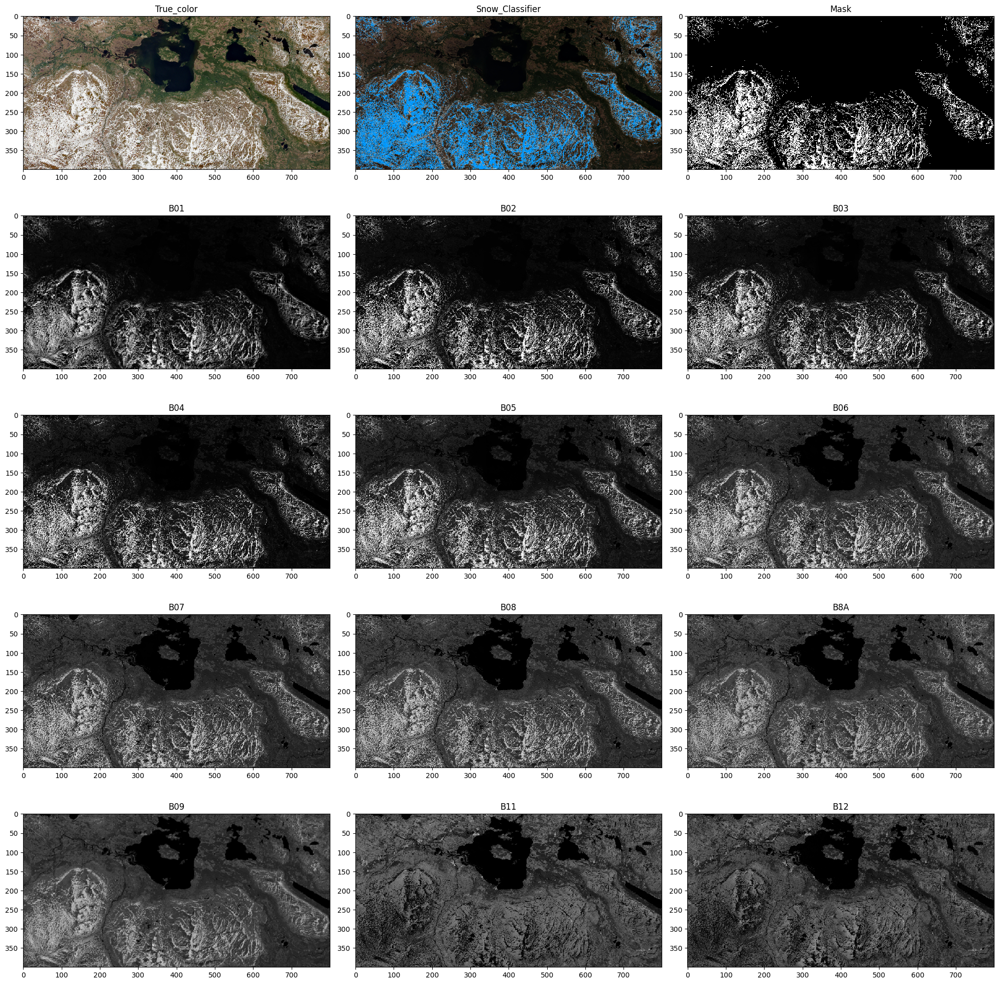

In [10]:
balanced_images_dict = all_images_dict[date_balanced]
filename = f"{base_path}/Readme-Visuals/input-data.png"
show_images(balanced_images_dict, data_keys, show_raw=True, figure_path=filename)

Show the true color, snow classifier, and the mask derived from the snow classifier for the images with most snow. The raw bands, that also are stored in the dictionary,are not shown.

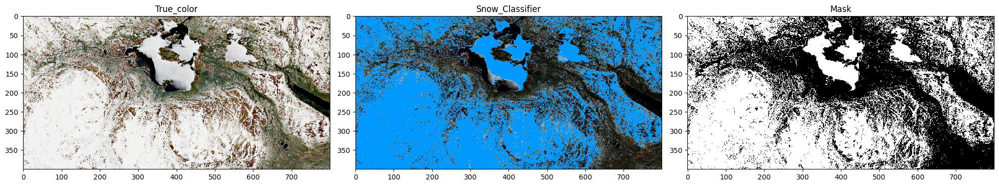

In [11]:
snowy_images_dict = all_images_dict[date_most_snow]
show_images(snowy_images_dict, data_keys, show_raw=False)

Show the true color, snow classifier, and the mask derived from the snow classifier for the images with less snow. The raw bands, that also are stored in the dictionary,are not shown.

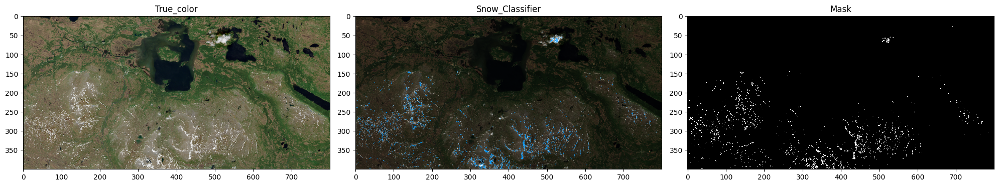

In [12]:
not_snowy_images_dict = all_images_dict[date_less_snow]
show_images(not_snowy_images_dict, data_keys, show_raw=False)

## Create Training and Testing Datasets

Create datasets of the images. This involves splitting the images into train and test images. The train and test split is just a cut in half, instead of the quite commonly random split. This is to enable reconstruction of the predicted images for evaluation. Patches are created for the CNN model, whilst the other models are fed with flattened images.

In [13]:
# Dictionary of datasets
datasets_dict = {}

patch_size = 3

for date, images_dict in all_images_dict.items():
    if 'Mask' not in images_dict:
        continue
        print(f"Mask is missing for {date}")
    if not images_dict['complete']:
        continue
        print("Bands are missing for {date}")

    print(f"Processing sample: {date}")
    dataset = {}

    # Make an array of all raw bands, meaning all input images.
    bands = []
    #for key, img in images_dict.items():
    for key in data_keys:
        img = images_dict[key]
        if 'Raw' in key:
            if img.ndim == 2:
                img = img[:, :, np.newaxis]
            bands.append(img)

    # Stack the raw images in the array to an array of shape (H, W, B)
    stacked_img = np.concatenate(bands, axis=-1)
    # The shape of the mask is (H, W)
    mask = images_dict['Mask']

    h, w, c = stacked_img.shape
    mid = w // 2

    # Spatial split: left = train, right = test
    dataset['img_train'] = stacked_img[:, :mid, :]
    dataset['img_test'] = stacked_img[:, mid:, :]

    dataset['mask_train'] = mask[:, :mid]
    dataset['mask_test'] = mask[:, mid:]

    dataset['h'], dataset['w'], dataset['c'] = dataset['mask_test'].shape

    # Extract patches
    X_train = extract_patches_2d(dataset['img_train'], (patch_size, patch_size))
    y_train = extract_patches_2d(dataset['mask_train'], (patch_size, patch_size))
    X_test = extract_patches_2d(dataset['img_test'], (patch_size, patch_size))
    y_test = extract_patches_2d(dataset['mask_test'], (patch_size, patch_size))

    dataset['X_train_patches'] = X_train
    dataset['y_train_patches'] = y_train
    dataset['X_test_patches'] = X_test
    dataset['y_test_patches'] = y_test

    datasets_dict[date] = dataset

    train_test_dir = f"Train-Test-{h}-{w}-{patch_size}"
    os.makedirs(f"{train_test_dir}/{date}", exist_ok=True)

    # Save patches to file
    np.save(f"{train_test_dir}/{date}/X_train.npy", X_train)
    np.save(f"{train_test_dir}/{date}/y_train.npy", y_train)
    np.save(f"{train_test_dir}/{date}/X_test.npy", X_test)
    np.save(f"{train_test_dir}/{date}/y_test.npy", y_test)

print(f"Train image shape: {datasets_dict[date_balanced]['img_train'].shape}, mask shape: {datasets_dict[date_balanced]['mask_train'].shape}")
print(f"Test image shape: {datasets_dict[date_balanced]['img_test'].shape}, mask shape: {datasets_dict[date_balanced]['mask_test'].shape}")

Processing sample: 2021-05-30
Processing sample: 2018-06-02
Processing sample: 2022-05-17
Train image shape: (400, 400, 12), mask shape: (400, 400, 1)
Test image shape: (400, 400, 12), mask shape: (400, 400, 1)


# Train Models and Predict Values

In [14]:
# Use the images with a balanced share of snow for training
training_datset = datasets_dict[date_balanced]
# Dictionary to store performance metrics
accuracy_precision_dict = {}

## Imports and Functions

In [15]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, precision_score

In [16]:
def plot_results(mask, pred, diff, filename=False):
    """
    Plot the mask, reconstructed predicted image and agreement between the mask and prediciton

    Input:
        mask: image with true labels
        pred: predicted image
        diff: binary image with 1 where mask and pred agrees and 0 where they dissagree
    """
    plt.figure(figsize=(18, 6))#figsize=(18, 6))  # Increase width to accommodate 3 subplots

    plt.subplot(1, 3, 1)
    plt.title('True Labels')
    plt.imshow(mask, cmap='gray', interpolation='None')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Predicted Labels')
    plt.imshow(pred, cmap='gray', interpolation='None')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Difference')
    plt.imshow(diff, cmap='RdYlGn', interpolation='None')
    plt.axis('off')

    plt.tight_layout()
    if filename:
        plt.savefig(filename)
    plt.show()

## Read Data

In [17]:
#X_train = np.load(f"{train_test_data_path}/X_train.npy")
#X_test = np.load(f"{train_test_data_path}/X_test.npy")
#y_train = np.load(f"{train_test_data_path}/y_train.npy")
#y_test = np.load(f"{train_test_data_path}/y_test.npy")

## CNN

### Imports

In [18]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping

### Initialize and Train

In [19]:
num_classes = 2

# OBS
# Ensure labels are in shape (samples, 3, 3) with integer class values
#y_train = training_datset['y_train'].squeeze()
#y_test = training_datset['y_test'].squeeze()

# Create CNN model with three convolutional layers
cnn_model = models.Sequential([
    layers.Conv2D(32, (2, 2), activation='relu', padding='same', input_shape=(3, 3, 12)),
    layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
    layers.Conv2D(num_classes, (1, 1), activation='softmax', padding='same')  # output shape: (3, 3, 2)
])

# Settings for optimizing/trining the model
cnn_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Stop training if the validation accuracy doesn't improve with more than 0.5%
early_stop = EarlyStopping(
    monitor='val_accuracy',
    min_delta=0.005,  # 0.5% improvement threshold
    patience=2,       # Wait 2 epochs before stopping
    restore_best_weights=True
)

# Train model with training patches
history = cnn_model.fit(
    training_datset['X_train_patches'], training_datset['y_train_patches'],
    epochs=5,
    validation_split=0.1,
    callbacks=[early_stop]
)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
4456/4456 ━━━━━━━━━━━━━━━━━━━━ 23s 5ms/step - accuracy: 0.9688 - loss: 47.4194 - val_accuracy: 0.9623 - val_loss: 2.1885
Epoch 2/5
4456/4456 ━━━━━━━━━━━━━━━━━━━━ 24s 5ms/step - accuracy: 0.9798 - loss: 0.6224 - val_accuracy: 0.9681 - val_loss: 0.2511
Epoch 3/5
4456/4456 ━━━━━━━━━━━━━━━━━━━━ 41s 5ms/step - accuracy: 0.9814 - loss: 0.0940 - val_accuracy: 0.9700 - val_loss: 0.0987
Epoch 4/5
4456/4456 ━━━━━━━━━━━━━━━━━━━━ 26s 6ms/step - accuracy: 0.9840 - loss: 0.0557 - val_accuracy: 0.9618 - val_loss: 0.1054


### Predict and Evaluate
Use the testing images for the three different dates (balanced, snow share, more snow and less snow) for evaluation

#### Balanced Test Image

4951/4951 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step


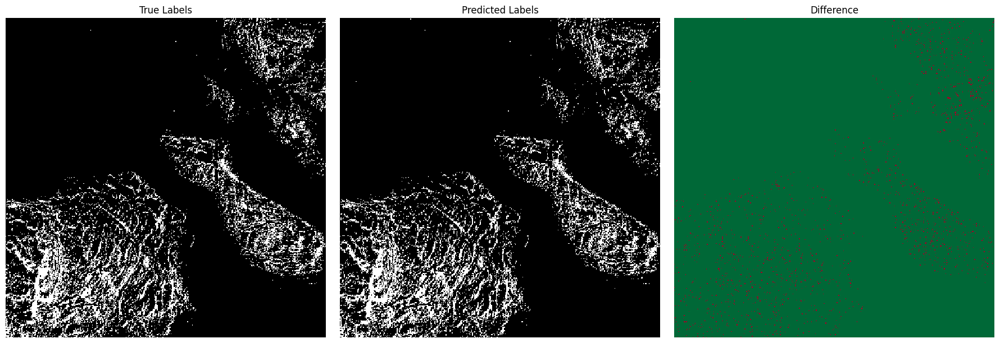

In [20]:
# Predict classes
y_pred_balanced = cnn_model.predict(training_datset['X_test_patches'])
# Convert probabilities to class labels by taking the class with largest probability
y_pred_classes_balanced = y_pred_balanced.argmax(axis=-1)

# Reconstruct images from patches
reconstructed_balanced_mask = reconstruct_from_patches_2d(training_datset['y_test_patches'], (training_datset['h'], training_datset['w']))
reconstructed_balanced_pred = reconstruct_from_patches_2d(y_pred_classes_balanced, (training_datset['h'], training_datset['w']))
reconstructed_balanced_pred = (reconstructed_balanced_pred >= 0.5).astype(int)
reconstructed_balanced_diff = reconstructed_balanced_pred == reconstructed_balanced_mask

filename = f"{save_path}/CNN-balanced"
plot_results(reconstructed_balanced_mask, reconstructed_balanced_pred, reconstructed_balanced_diff, filename=filename)

#### Snowy Test Image

4951/4951 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step


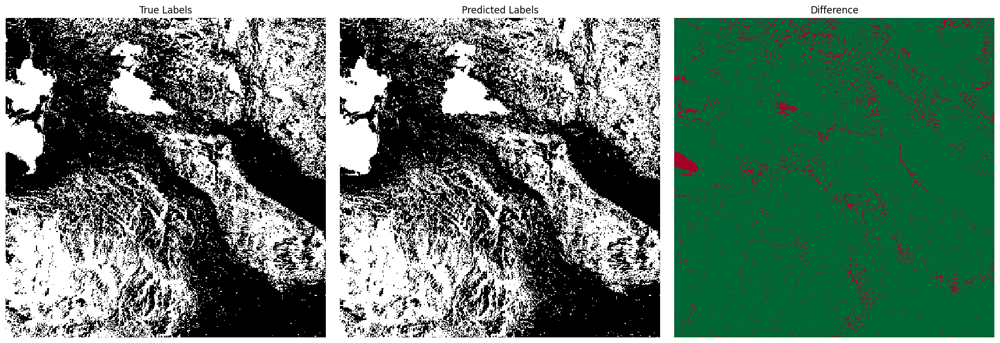

In [21]:
snowy_dataset = datasets_dict[date_most_snow]

y_pred_snowy = cnn_model.predict(snowy_dataset['X_test_patches'])
y_pred_classes_snowy = y_pred_snowy.argmax(axis=-1)  # Convert probabilities to class labels

reconstructed_snowy_mask = reconstruct_from_patches_2d(snowy_dataset['y_test_patches'], (snowy_dataset['h'], snowy_dataset['w']))
reconstructed_snowy_pred = reconstruct_from_patches_2d(y_pred_classes_snowy, (snowy_dataset['h'], snowy_dataset['w']))
reconstructed_snowy_pred = (reconstructed_snowy_pred >= 0.5).astype(int)
reconstructed_snowy_diff = reconstructed_snowy_pred == reconstructed_snowy_mask

filename = f"{save_path}/CNN-snowy"
plot_results(reconstructed_snowy_mask, reconstructed_snowy_pred, reconstructed_snowy_diff, filename=filename)

#### Less Snowy Test Image

4951/4951 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step


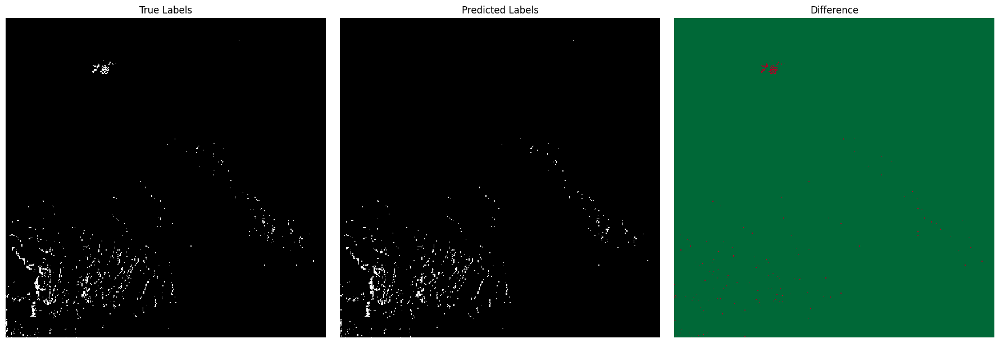

In [22]:
less_snowy_dataset = datasets_dict[date_less_snow]

y_pred_less_snowy = cnn_model.predict(less_snowy_dataset['X_test_patches'])
y_pred_classes_less_snowy = y_pred_less_snowy.argmax(axis=-1)  # Convert probabilities to class labels

reconstructed_less_snowy_mask = reconstruct_from_patches_2d(less_snowy_dataset['y_test_patches'], (less_snowy_dataset['h'], less_snowy_dataset['w']))
reconstructed_less_snowy_pred = reconstruct_from_patches_2d(y_pred_classes_less_snowy, (less_snowy_dataset['h'], less_snowy_dataset['w']))
reconstructed_less_snowy_pred = (reconstructed_less_snowy_pred >= 0.5).astype(int)
reconstructed_less_snowy_diff = reconstructed_less_snowy_pred == reconstructed_less_snowy_mask

filename = f"{save_path}/CNN-less-snowy"
plot_results(reconstructed_less_snowy_mask, reconstructed_less_snowy_pred, reconstructed_less_snowy_diff, filename=filename)

#### Confusion Matrix
Create confusion matrices showing accuracy, precision, recall and F1 score for all of the three test images.

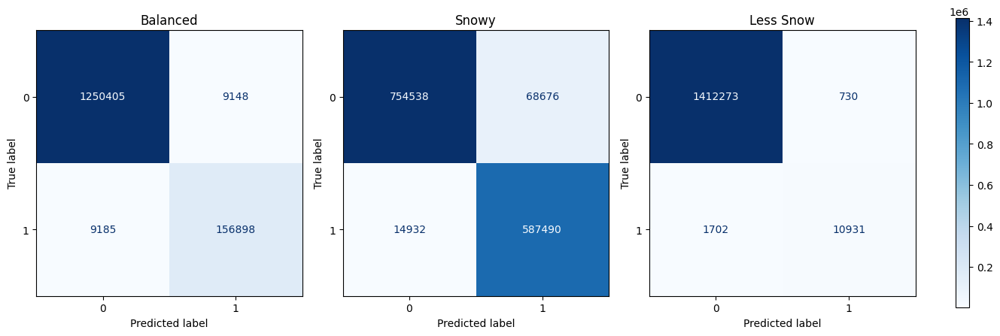

In [23]:
fig = plt.figure(figsize=(16, 5))
gs = gridspec.GridSpec(1, 4, width_ratios=[1, 1, 1, 0.05], wspace=0.2)

axes = [plt.subplot(gs[i]) for i in range(3)]
cax = plt.subplot(gs[3])

# Balanced test
cm_balanced = confusion_matrix(training_datset['y_test_patches'].flatten(), y_pred_classes_balanced.flatten())
disp_balanced = ConfusionMatrixDisplay(
    confusion_matrix=cm_balanced,
    display_labels=sorted(set(training_datset['y_test_patches'].reshape(-1)))
)
disp_balanced.plot(cmap='Blues', values_format='d', ax=axes[0], colorbar=False)
axes[0].set_title('Balanced')

# Snowy test
cm_snowy = confusion_matrix(snowy_dataset['y_test_patches'].flatten(), y_pred_classes_snowy.flatten())
disp_snowy = ConfusionMatrixDisplay(
    confusion_matrix=cm_snowy,
    display_labels=sorted(set(snowy_dataset['y_test_patches'].reshape(-1)))
)
disp_snowy.plot(cmap='Blues', values_format='d', ax=axes[1], colorbar=False)
axes[1].set_title('Snowy')

# Less snowy test
cm_less_snow = confusion_matrix(less_snowy_dataset['y_test_patches'].flatten(), y_pred_classes_less_snowy.flatten())
disp_less_snow = ConfusionMatrixDisplay(
    confusion_matrix=cm_less_snow,
    display_labels=sorted(set(less_snowy_dataset['y_test_patches'].flatten()))
)
disp_less_snow.plot(cmap='Blues', values_format='d', ax=axes[2], colorbar=False)
axes[2].set_title('Less Snow')

fig.colorbar(axes[2].images[0], cax=cax)
plt.show()

In [24]:
# Create dictionary for accuracy and precision for the three test images
performance_dict = {}

# Balanced
y_true_balanced = training_datset['y_test_patches'].flatten()
y_pred_balanced = y_pred_classes_balanced.flatten()
performance_dict['balanced'] = {
    'accuracy': round(accuracy_score(y_true=y_true_balanced, y_pred=y_pred_balanced), 3),
    'precision': round(precision_score(y_true=y_true_balanced, y_pred=y_pred_balanced), 3)
}

# Snowy
y_true_snow = snowy_dataset['y_test_patches'].flatten()
y_pred_snow = y_pred_classes_snowy.flatten()
performance_dict['snowy'] = {
    'accuracy': round(accuracy_score(y_true=y_true_snow, y_pred=y_pred_snow), 3),
    'precision': round(precision_score(y_true=y_true_snow, y_pred=y_pred_snow), 3)
}

# Less snowy
y_true_less = less_snowy_dataset['y_test_patches'].flatten()
y_pred_less = y_pred_classes_less_snowy.flatten()
performance_dict['less_snowy'] = {
    'accuracy': round(accuracy_score(y_true=y_true_less, y_pred=y_pred_less), 3),
    'precision': round(precision_score(y_true=y_true_less, y_pred=y_pred_less), 3)
}

# Store the performance_dict for the CNN model in the accuracy_precision_dict
accuracy_precision_dict['CNN'] = performance_dict

# Print
print("\t\t Accuracy\t\t Precision")
for key in performance_dict:
    print(f"{key.capitalize():<12} \t  {performance_dict[key]['accuracy']:<16} \t  {performance_dict[key]['precision']}")


		 Accuracy		 Precision
Balanced     	  0.987            	  0.945
Snowy        	  0.941            	  0.895
Less_snowy   	  0.998            	  0.937


## Random Forest

### Imports

In [25]:
from sklearn.ensemble import RandomForestClassifier

### Initialize and Train

In [26]:
# Flatten inputs and labels
X_reshaped = training_datset['img_train'].reshape(-1, 12)
y_reshaped = training_datset['mask_train'].reshape(-1)

# Train the classifier
clf = RandomForestClassifier(n_estimators=100)
clf.fit(X_reshaped, y_reshaped)


RandomForestClassifier()

### Predict and Evaluate
Use the testing images for the three different dates (balanced, snow share, more snow and less snow) for evaluation

#### Balanced Test Image

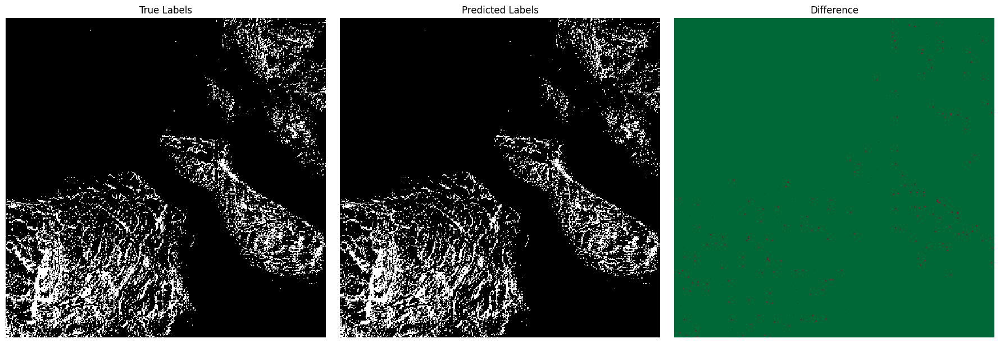

In [27]:
# Flatten inputs
X_test_reshaped = training_datset['img_test'].reshape(-1, 12)
# Predict class
y_pred_balanced = clf.predict(X_test_reshaped)

# Reconstruct image from predicted labels
y_pred_balanced_image = y_pred_balanced.reshape(training_datset['h'], training_datset['w'])

filename = f"{save_path}/Random-Forest-balanced"
plot_results(training_datset['mask_test'].squeeze(), y_pred_balanced_image, y_pred_balanced_image == training_datset['mask_test'].squeeze(), filename=filename)

#### Snowy Test Image

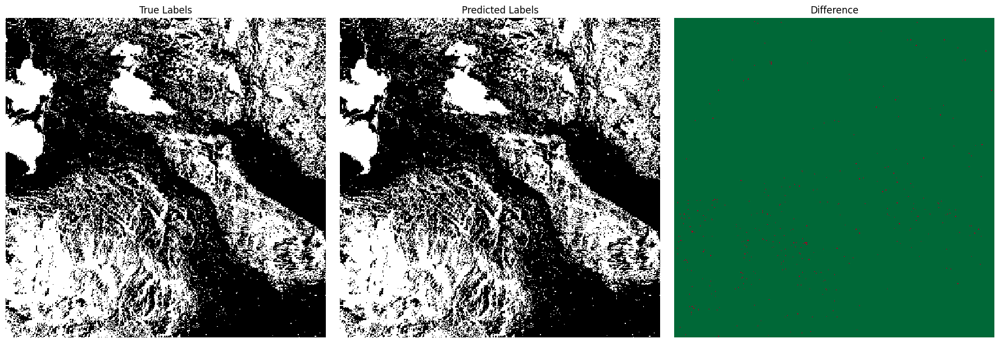

In [28]:
snowy_dataset = datasets_dict[date_most_snow]

X_test_reshaped = snowy_dataset['img_test'].reshape(-1, 12)
y_pred_snowy = clf.predict(X_test_reshaped)

y_pred_snowy_image = y_pred_snowy.reshape(snowy_dataset['h'], snowy_dataset['w'])

filename = f"{save_path}/Random-Forest-snowy"
plot_results(snowy_dataset['mask_test'].squeeze(), y_pred_snowy_image, y_pred_snowy_image == snowy_dataset['mask_test'].squeeze(), filename=filename)

#### Less Snowy Test Image

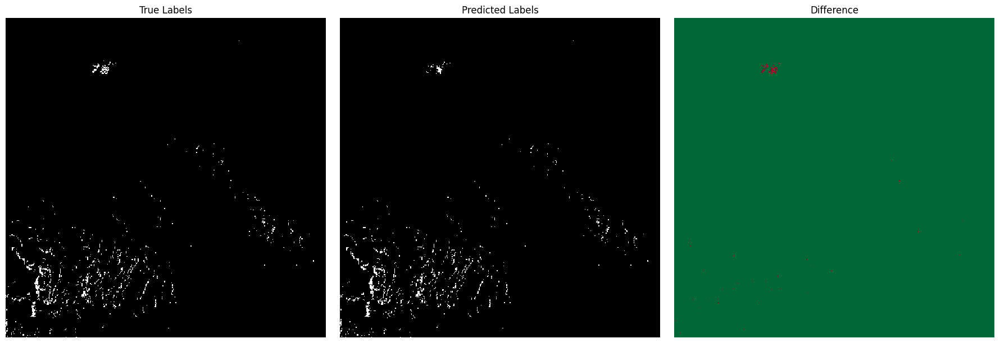

In [29]:
less_snowy_dataset = datasets_dict[date_less_snow]

X_test_reshaped = less_snowy_dataset['img_test'].reshape(-1, 12)
y_pred_less_snow = clf.predict(X_test_reshaped)

y_pred_less_snow_image = y_pred_less_snow.reshape(less_snowy_dataset['h'], less_snowy_dataset['w'])

filename = f"{save_path}/Random-Forest-less-snowy"
plot_results(less_snowy_dataset['mask_test'].squeeze(), y_pred_less_snow_image, y_pred_less_snow_image == less_snowy_dataset['mask_test'].squeeze(), filename=filename)

#### Confusion Matrix

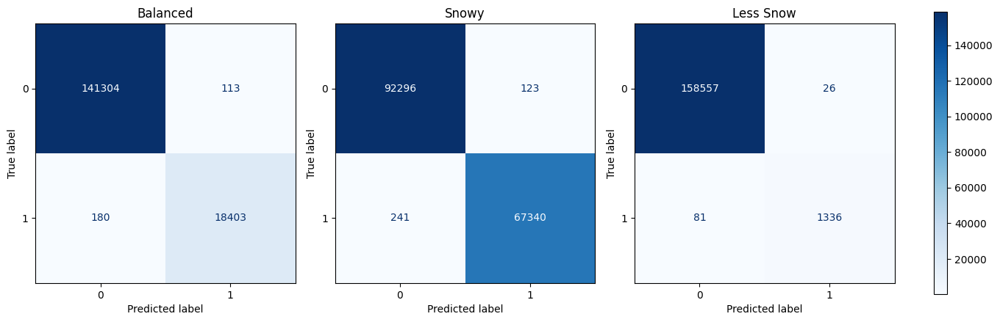

In [30]:
fig = plt.figure(figsize=(16, 5))
gs = gridspec.GridSpec(1, 4, width_ratios=[1, 1, 1, 0.05], wspace=0.2)

axes = [plt.subplot(gs[i]) for i in range(3)]
cax = plt.subplot(gs[3])

# Balanced test
cm_balanced = confusion_matrix(training_datset['mask_test'].reshape(-1), y_pred_balanced)
disp_balanced = ConfusionMatrixDisplay(
    confusion_matrix=cm_balanced,
    display_labels=sorted(set(training_datset['mask_test'].reshape(-1)))
)
disp_balanced.plot(cmap='Blues', values_format='d', ax=axes[0], colorbar=False)
axes[0].set_title('Balanced')

# Snowy test
cm_snowy = confusion_matrix(snowy_dataset['mask_test'].reshape(-1), y_pred_snowy)
disp_snowy = ConfusionMatrixDisplay(
    confusion_matrix=cm_snowy,
    display_labels=sorted(set(snowy_dataset['mask_test'].reshape(-1)))
)
disp_snowy.plot(cmap='Blues', values_format='d', ax=axes[1], colorbar=False)
axes[1].set_title('Snowy')

# Less snowy test
cm_less_snow = confusion_matrix(less_snowy_dataset['mask_test'].reshape(-1), y_pred_less_snow)
disp_less_snow = ConfusionMatrixDisplay(
    confusion_matrix=cm_less_snow,
    display_labels=sorted(set(less_snowy_dataset['mask_test'].reshape(-1)))
)
disp_less_snow.plot(cmap='Blues', values_format='d', ax=axes[2], colorbar=False)
axes[2].set_title('Less Snow')

fig.colorbar(axes[2].images[0], cax=cax)
plt.show()

In [31]:
performance_dict = {}

# Balanced
y_true_balanced = training_datset['mask_test'].reshape(-1)
y_pred_balanced = y_pred_balanced
performance_dict['balanced'] = {
    'accuracy': round(accuracy_score(y_true=y_true_balanced, y_pred=y_pred_balanced), 3),
    'precision': round(precision_score(y_true=y_true_balanced, y_pred=y_pred_balanced), 3)
}

# Snowy
y_true_snow = snowy_dataset['mask_test'].reshape(-1)
y_pred_snow = y_pred_snowy
performance_dict['snowy'] = {
    'accuracy': round(accuracy_score(y_true=y_true_snow, y_pred=y_pred_snow), 3),
    'precision': round(precision_score(y_true=y_true_snow, y_pred=y_pred_snow), 3)
}

# Less snowy
y_true_less = less_snowy_dataset['mask_test'].reshape(-1)
y_pred_less = y_pred_less_snow
performance_dict['less_snowy'] = {
    'accuracy': round(accuracy_score(y_true=y_true_less, y_pred=y_pred_less), 3),
    'precision': round(precision_score(y_true=y_true_less, y_pred=y_pred_less), 3)
}

accuracy_precision_dict['Random_Forest'] = performance_dict

# Print
print("\t\t Accuracy\t\t Precision")
for key in performance_dict:
    print(f"{key.capitalize():<12} \t  {performance_dict[key]['accuracy']:<16} \t  {performance_dict[key]['precision']}")


		 Accuracy		 Precision
Balanced     	  0.998            	  0.994
Snowy        	  0.998            	  0.998
Less_snowy   	  0.999            	  0.981


## K-Means

### Imports

In [32]:
from sklearn.cluster import KMeans

### Initialize and Cluster

In [33]:
# Flatten inputs
X_reshaped = training_datset['img_train'].reshape(-1, 12)
# Fit cluster centroids to training data
kmeans = KMeans(n_clusters=2, random_state=0).fit(X_reshaped)

### Predict and Evaluate
Use the testing images for the three different dates (balanced, snow share, more snow and less snow) for evaluation

#### Balanced Test Image

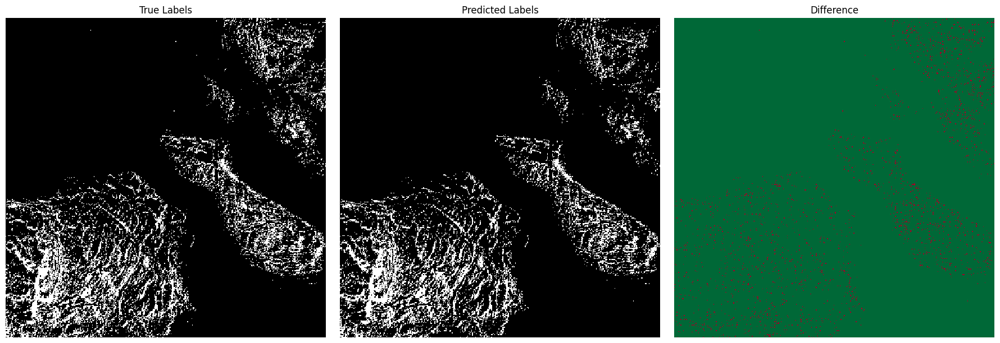

In [34]:
# Flatten input
X_test_reshaped = training_datset['img_test'].reshape(-1, 12)
# Classify input to the closest cluster centroid
y_pred_balanced = kmeans.predict(X_test_reshaped).reshape(400, 400)

# Reconstruct image from predicted labels
y_pred_balanced_image = y_pred_balanced.reshape(training_datset['h'], training_datset['w'])

filename = f"{save_path}/K-means-balanced"
plot_results(training_datset['mask_test'].squeeze(), y_pred_balanced_image, y_pred_balanced_image == training_datset['mask_test'].squeeze(), filename=filename)

#### Snowy Test Image

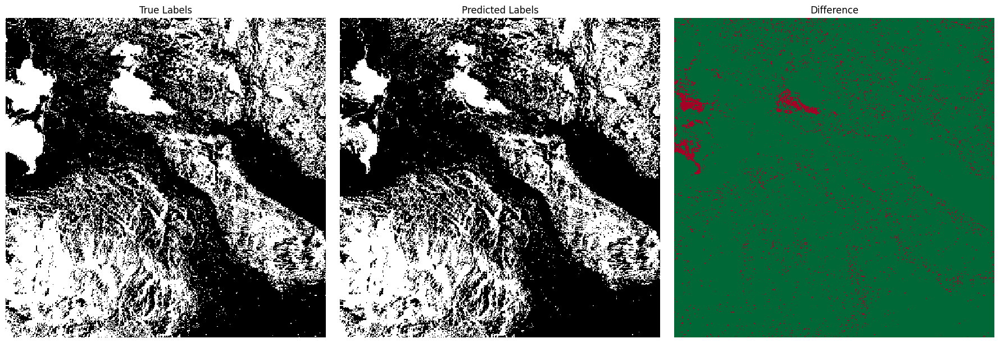

In [35]:
snowy_dataset = datasets_dict[date_most_snow]

X_test_reshaped = snowy_dataset['img_test'].reshape(-1, 12)
y_pred_snowy = kmeans.predict(X_test_reshaped)

y_pred_snowy_image = y_pred_snowy.reshape(snowy_dataset['h'], snowy_dataset['w'])

filename = f"{save_path}/K-means-snowy"
plot_results(snowy_dataset['mask_test'].squeeze(), y_pred_snowy_image, y_pred_snowy_image == snowy_dataset['mask_test'].squeeze(), filename=filename)

#### Less Snowy Test Image

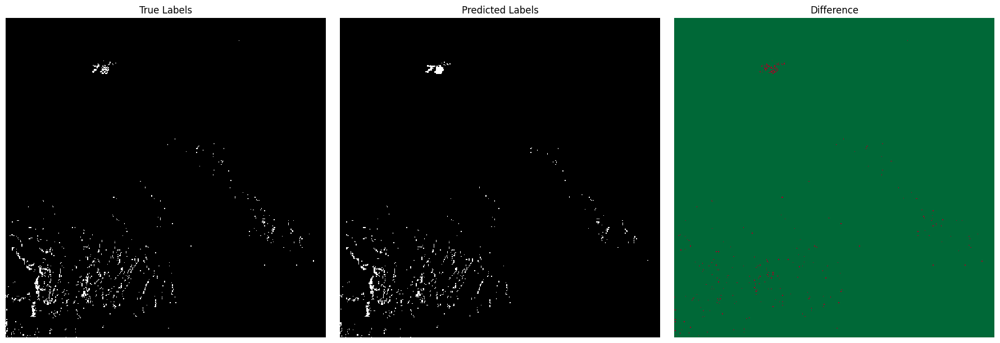

In [36]:
less_snowy_dataset = datasets_dict[date_less_snow]

X_test_reshaped = less_snowy_dataset['img_test'].reshape(-1, 12)
y_pred_less_snow = kmeans.predict(X_test_reshaped)

y_pred_less_snow_image = y_pred_less_snow.reshape(less_snowy_dataset['h'], less_snowy_dataset['w'])

filename = f"{save_path}/K-means-less-snowy"
plot_results(less_snowy_dataset['mask_test'].squeeze(), y_pred_less_snow_image, y_pred_less_snow_image == less_snowy_dataset['mask_test'].squeeze(), filename=filename)

#### Confusion Matrix

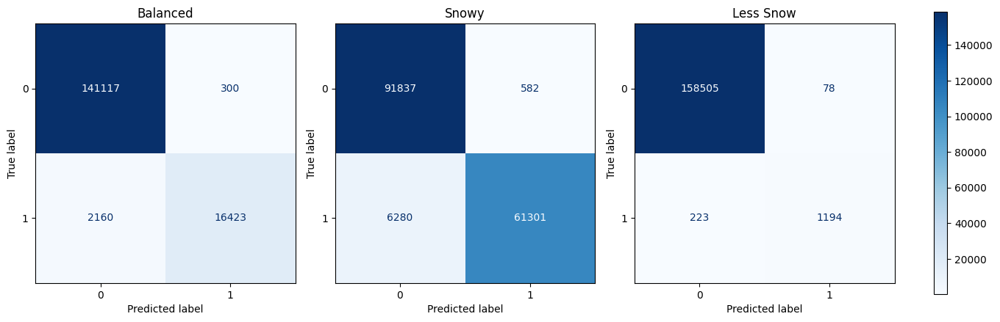

In [37]:
fig = plt.figure(figsize=(16, 5))
gs = gridspec.GridSpec(1, 4, width_ratios=[1, 1, 1, 0.05], wspace=0.2)

axes = [plt.subplot(gs[i]) for i in range(3)]
cax = plt.subplot(gs[3])

# Balanced test
cm_balanced = confusion_matrix(training_datset['mask_test'].reshape(-1), y_pred_balanced.reshape(-1))
disp_balanced = ConfusionMatrixDisplay(
    confusion_matrix=cm_balanced,
    display_labels=sorted(set(training_datset['mask_test'].reshape(-1)))
)
disp_balanced.plot(cmap='Blues', values_format='d', ax=axes[0], colorbar=False)
axes[0].set_title('Balanced')

# Snowy test
cm_snowy = confusion_matrix(snowy_dataset['mask_test'].reshape(-1), y_pred_snowy.reshape(-1))
disp_snowy = ConfusionMatrixDisplay(
    confusion_matrix=cm_snowy,
    display_labels=sorted(set(snowy_dataset['mask_test'].reshape(-1)))
)
disp_snowy.plot(cmap='Blues', values_format='d', ax=axes[1], colorbar=False)
axes[1].set_title('Snowy')

# Less snowy test
cm_less_snow = confusion_matrix(less_snowy_dataset['mask_test'].reshape(-1), y_pred_less_snow.reshape(-1))
disp_less_snow = ConfusionMatrixDisplay(
    confusion_matrix=cm_less_snow,
    display_labels=sorted(set(less_snowy_dataset['mask_test'].reshape(-1)))
)
disp_less_snow.plot(cmap='Blues', values_format='d', ax=axes[2], colorbar=False)
axes[2].set_title('Less Snow')

fig.colorbar(axes[2].images[0], cax=cax)
plt.show()

In [38]:
performance_dict = {}

# Balanced
y_true_balanced = training_datset['mask_test'].reshape(-1)
y_pred_balanced = y_pred_balanced.reshape(-1)
performance_dict['balanced'] = {
    'accuracy': round(accuracy_score(y_true=y_true_balanced, y_pred=y_pred_balanced), 3),
    'precision': round(precision_score(y_true=y_true_balanced, y_pred=y_pred_balanced), 3)
}

# Snowy
y_true_snow = snowy_dataset['mask_test'].reshape(-1)
y_pred_snow = y_pred_snowy.reshape(-1)
performance_dict['snowy'] = {
    'accuracy': round(accuracy_score(y_true=y_true_snow, y_pred=y_pred_snow), 3),
    'precision': round(precision_score(y_true=y_true_snow, y_pred=y_pred_snow), 3)
}

# Less snowy
y_true_less = less_snowy_dataset['mask_test'].reshape(-1)
y_pred_less = y_pred_less_snow.reshape(-1)
performance_dict['less_snowy'] = {
    'accuracy': round(accuracy_score(y_true=y_true_less, y_pred=y_pred_less), 3),
    'precision': round(precision_score(y_true=y_true_less, y_pred=y_pred_less), 3)
}

accuracy_precision_dict['K-Means'] = performance_dict

# Print
print("\t\t Accuracy\t\t Precision")
for key in performance_dict:
    print(f"{key.capitalize():<12} \t  {performance_dict[key]['accuracy']:<16} \t  {performance_dict[key]['precision']}")


		 Accuracy		 Precision
Balanced     	  0.985            	  0.982
Snowy        	  0.957            	  0.991
Less_snowy   	  0.998            	  0.939


## Gaussian Mixture Models

### Imports

In [39]:
from sklearn.mixture import GaussianMixture

### Initialize and Fit

In [40]:
# Flatten input data
X_reshaped = training_datset['img_train'].reshape(-1, 12)
# Initialize and fit cluster algorithm
gmm = GaussianMixture(n_components=2, random_state=0).fit(X_reshaped)

### Predict and Evaluate
Use the testing images for the three different dates (balanced, snow share, more snow and less snow) for evaluation

#### Balanced

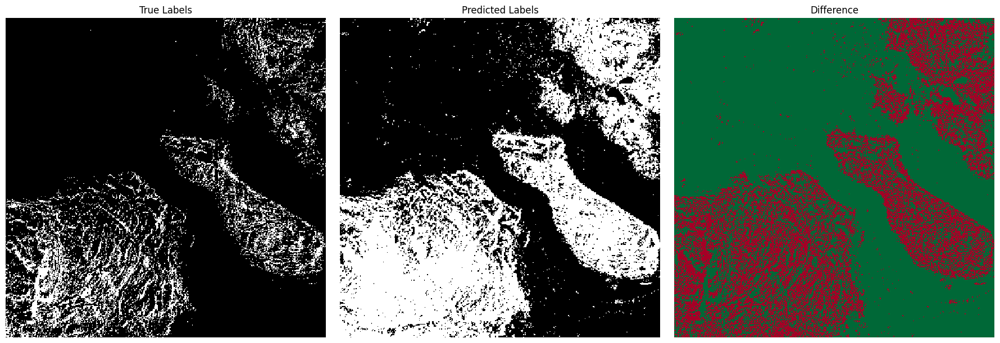

In [41]:
# Flatten input images
X_test_reshaped = training_datset['img_test'].reshape(-1, 12)
# Predict classes
y_pred_balanced = gmm.predict(X_test_reshaped).reshape(400, 400)

# Recontruct image from predicted labels
y_pred_balanced_image = y_pred_balanced.reshape(training_datset['h'], training_datset['w'])

filename = f"{save_path}/GMM-balanced"
plot_results(training_datset['mask_test'].squeeze(), y_pred_balanced_image, y_pred_balanced_image == training_datset['mask_test'].squeeze(), filename=filename)

#### Snowy Test Image

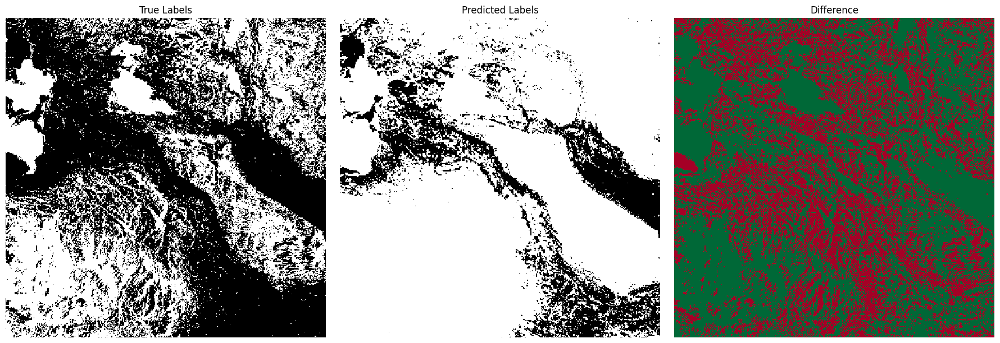

In [42]:
snowy_dataset = datasets_dict[date_most_snow]

X_test_reshaped = snowy_dataset['img_test'].reshape(-1, 12)
y_pred_snowy = gmm.predict(X_test_reshaped)

y_pred_snowy_image = y_pred_snowy.reshape(snowy_dataset['h'], snowy_dataset['w'])

filename = f"{save_path}/GMM-snowy"
plot_results(snowy_dataset['mask_test'].squeeze(), y_pred_snowy_image, y_pred_snowy_image == snowy_dataset['mask_test'].squeeze(), filename=filename)

#### Less Snowy Test Image

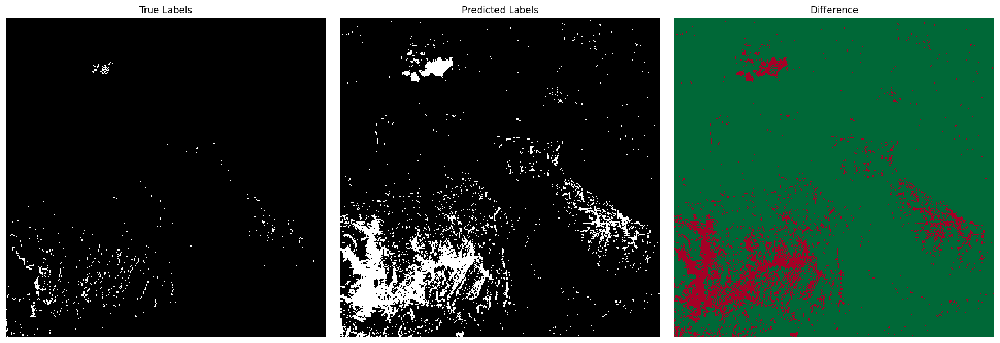

In [43]:
less_snowy_dataset = datasets_dict[date_less_snow]

X_test_reshaped = less_snowy_dataset['img_test'].reshape(-1, 12)
y_pred_less_snow = gmm.predict(X_test_reshaped)

y_pred_less_snow_image = y_pred_less_snow.reshape(less_snowy_dataset['h'], less_snowy_dataset['w'])

filename = f"{save_path}/GMM-less-snowy"
plot_results(less_snowy_dataset['mask_test'].squeeze(), y_pred_less_snow_image, y_pred_less_snow_image == less_snowy_dataset['mask_test'].squeeze(), filename=filename)

#### Confusion Matrix

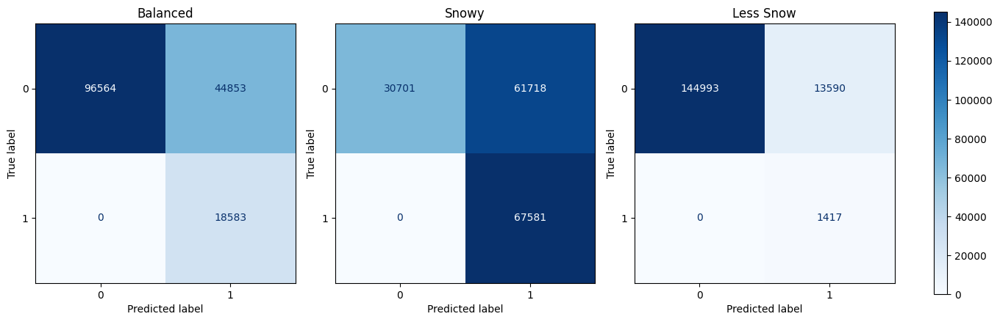

In [44]:
fig = plt.figure(figsize=(16, 5))
gs = gridspec.GridSpec(1, 4, width_ratios=[1, 1, 1, 0.05], wspace=0.2)

axes = [plt.subplot(gs[i]) for i in range(3)]
cax = plt.subplot(gs[3])

# Balanced test
cm_balanced = confusion_matrix(training_datset['mask_test'].reshape(-1), y_pred_balanced.reshape(-1))
disp_balanced = ConfusionMatrixDisplay(
    confusion_matrix=cm_balanced,
    display_labels=sorted(set(training_datset['mask_test'].reshape(-1)))
)
disp_balanced.plot(cmap='Blues', values_format='d', ax=axes[0], colorbar=False)
axes[0].set_title('Balanced')

# Snowy test
cm_snowy = confusion_matrix(snowy_dataset['mask_test'].reshape(-1), y_pred_snowy.reshape(-1))
disp_snowy = ConfusionMatrixDisplay(
    confusion_matrix=cm_snowy,
    display_labels=sorted(set(snowy_dataset['mask_test'].reshape(-1)))
)
disp_snowy.plot(cmap='Blues', values_format='d', ax=axes[1], colorbar=False)
axes[1].set_title('Snowy')

# Less snowy test
cm_less_snow = confusion_matrix(less_snowy_dataset['mask_test'].reshape(-1), y_pred_less_snow.reshape(-1))
disp_less_snow = ConfusionMatrixDisplay(
    confusion_matrix=cm_less_snow,
    display_labels=sorted(set(less_snowy_dataset['mask_test'].reshape(-1)))
)
disp_less_snow.plot(cmap='Blues', values_format='d', ax=axes[2], colorbar=False)
axes[2].set_title('Less Snow')

fig.colorbar(axes[2].images[0], cax=cax)
plt.show()

In [45]:
performance_dict = {}

# Balanced
y_true_balanced = training_datset['mask_test'].reshape(-1)
y_pred_balanced = y_pred_balanced.reshape(-1)
performance_dict['balanced'] = {
    'accuracy': round(accuracy_score(y_true=y_true_balanced, y_pred=y_pred_balanced), 3),
    'precision': round(precision_score(y_true=y_true_balanced, y_pred=y_pred_balanced), 3)
}

# Snowy
y_true_snow = snowy_dataset['mask_test'].reshape(-1)
y_pred_snow = y_pred_snowy.reshape(-1)
performance_dict['snowy'] = {
    'accuracy': round(accuracy_score(y_true=y_true_snow, y_pred=y_pred_snow), 3),
    'precision': round(precision_score(y_true=y_true_snow, y_pred=y_pred_snow), 3)
}

# Less snowy
y_true_less = less_snowy_dataset['mask_test'].reshape(-1)
y_pred_less = y_pred_less_snow.reshape(-1)
performance_dict['less_snowy'] = {
    'accuracy': round(accuracy_score(y_true=y_true_less, y_pred=y_pred_less), 3),
    'precision': round(precision_score(y_true=y_true_less, y_pred=y_pred_less), 3)
}

accuracy_precision_dict['GMM'] = performance_dict

# Print
print("\t\t Accuracy\t\t Precision")
for key in performance_dict:
    print(f"{key.capitalize():<12} \t  {performance_dict[key]['accuracy']:<16} \t  {performance_dict[key]['precision']}")


		 Accuracy		 Precision
Balanced     	  0.72             	  0.293
Snowy        	  0.614            	  0.523
Less_snowy   	  0.915            	  0.094


# Compare Models Performances

In [46]:
import pandas as pd

# Create a list of rows
rows = []
for model in accuracy_precision_dict:
    for test_img in ['balanced', 'snowy', 'less_snowy']:
        acc = round(accuracy_precision_dict[model][test_img]['accuracy'], 3)
        prec = round(accuracy_precision_dict[model][test_img]['precision'], 3)
        rows.append({
            'Model': model.replace('_', ' '),
            'Test Image': test_img.replace('_', ' ').capitalize(),
            'Accuracy': acc,
            'Precision': prec
        })

# Create DataFrame
df = pd.DataFrame(rows)

# Optional: sort for readability
df = df.sort_values(['Model', 'Test Image']).reset_index(drop=True)

# Shade cells based on their values
styled_df = (
    df.style
    .background_gradient(subset=['Accuracy', 'Precision'], cmap='Greens')
    .format({'Accuracy': '{:.3f}', 'Precision': '{:.3f}'})
    .hide(axis="index")  # hides the index
)

# To display in a Jupyter Notebook:
styled_df


Model,Test Image,Accuracy,Precision
CNN,Balanced,0.987,0.945
CNN,Less snowy,0.998,0.937
CNN,Snowy,0.941,0.895
GMM,Balanced,0.720,0.293
GMM,Less snowy,0.915,0.094
GMM,Snowy,0.614,0.523
K-Means,Balanced,0.985,0.982
K-Means,Less snowy,0.998,0.939
K-Means,Snowy,0.957,0.991
Random Forest,Balanced,0.998,0.994
